<a href="https://colab.research.google.com/github/Pavel184/Machine_vision/blob/Homework_lesson_8/Homework_lesson_8_rev_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Homework_lesson_8

## Переключение версии TensorFlow

In [25]:
%tensorflow_version 2.x

In [26]:
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
import tensorflow_datasets as tfds

## Загрузка и подготовка датасета LFW

In [27]:
tfds.disable_progress_bar()
(train_ds), ds_info = tfds.load(
    'LFW', 
    as_supervised=True,
    with_info=True
)

In [28]:
train_ds = train_ds.get('train')

## Визуализация датасета LFW

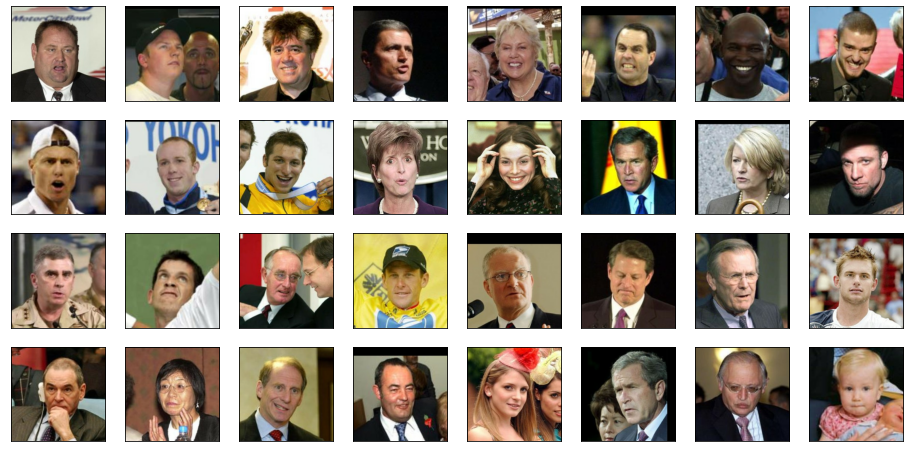

In [29]:
some_samples = [x[1] for x in iter(train_ds.take(32))]

fig = plt.figure(figsize=(16, 8))
for j in range(len(some_samples)):
    ax = fig.add_subplot(4, 8, j+1)
    ax.imshow(some_samples[j])
    plt.xticks([]), plt.yticks([])
plt.show()

## Deep Convolutional GAN (DCGAN)

## Создание Генератора и Дискриминатора

In [30]:
generator = tf.keras.Sequential([
    tf.keras.layers.Dense(128*16*16, activation='relu'),
    tf.keras.layers.Reshape((16, 16, 128)),
    tf.keras.layers.UpSampling2D((2, 2)),    
    tf.keras.layers.Conv2D(512, (3, 3), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.ReLU(),    
    tf.keras.layers.UpSampling2D((2, 2)),    
    tf.keras.layers.Conv2D(256, (3, 3), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.ReLU(),
    tf.keras.layers.UpSampling2D((2, 2)),    
    tf.keras.layers.Conv2D(128, (3, 3), padding='valid'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.ReLU(),
    tf.keras.layers.UpSampling2D((2, 2)),    
    tf.keras.layers.Conv2D(128, (3, 3), padding='valid'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.ReLU(),            
    tf.keras.layers.Conv2D(3, (3, 3), padding='same', activation='tanh'),
])

discriminator = tf.keras.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), strides=(2, 2), padding='same'),
    tf.keras.layers.LeakyReLU(0.2),
    tf.keras.layers.Dropout(0.25),    
    tf.keras.layers.Conv2D(64, kernel_size=3, strides=(2, 2), padding='same'),
    tf.keras.layers.ZeroPadding2D(padding=((0, 1), (0, 1))),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.LeakyReLU(alpha=0.2),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Conv2D(128, kernel_size=3, strides=(2, 2), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.LeakyReLU(alpha=0.2),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Conv2D(256, kernel_size=3, strides=(1, 1), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.LeakyReLU(alpha=0.2),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(256),
    tf.keras.layers.LeakyReLU(alpha=0.2), 
    tf.keras.layers.Dense(1),
])

## Подготовка пайплайна данных и оптимизатора

In [31]:
INPUT_DIM = 256
NUM_EPOCHS = 60
BATCH_SIZE = 32
HALF_BATCH_SIZE = int(BATCH_SIZE / 2)
LEARNING_RATE = 0.0002

def prepare(label, img):
    img = (tf.cast(img, tf.float32) - 127.5) / 127.5 
    return img


train_ds = train_ds.shuffle(buffer_size=1000)
train_ds = train_ds.map(prepare)
train_ds = train_ds.repeat(NUM_EPOCHS)
train_ds = train_ds.batch(HALF_BATCH_SIZE, drop_remainder=True)

optimizer = tf.keras.optimizers.Adam(LEARNING_RATE)
sigmoid_cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

## Обучение GAN

[Step  0] D Loss: 0.7022; G Loss: 0.0003


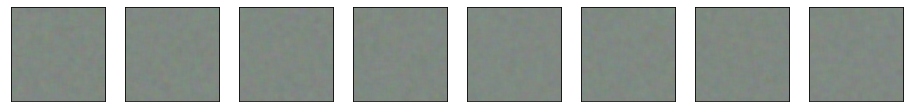

[Step 1000] D Loss: 1.3272; G Loss: 1.5013


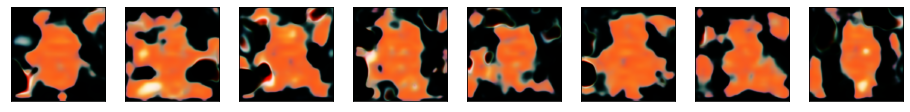

[Step 2000] D Loss: 0.5342; G Loss: 1.0749


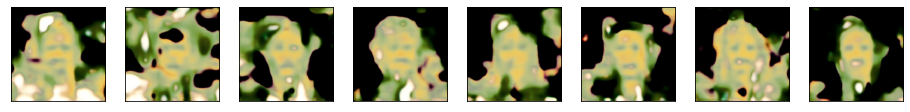

[Step 3000] D Loss: 0.0484; G Loss: 4.7192


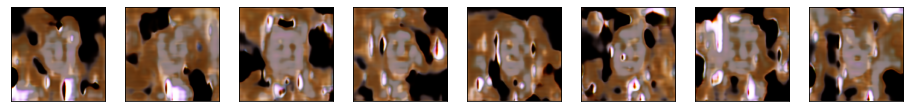

[Step 4000] D Loss: 0.2107; G Loss: 3.0186


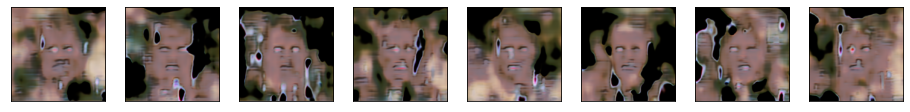

[Step 5000] D Loss: 0.8252; G Loss: 1.8540


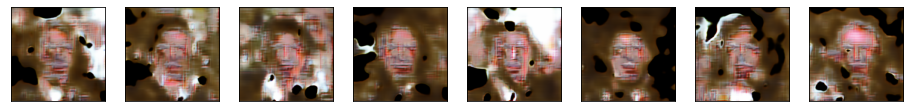

[Step 6000] D Loss: 0.1191; G Loss: 2.2905


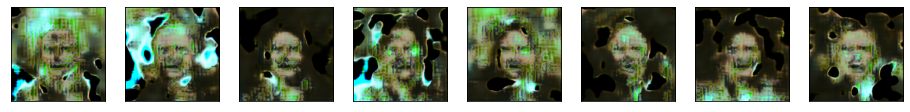

[Step 7000] D Loss: 0.0570; G Loss: 3.7935


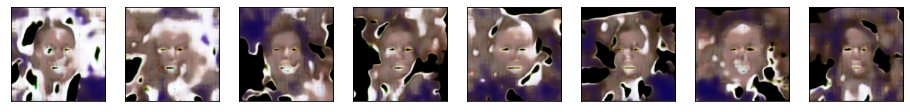

[Step 8000] D Loss: 0.3992; G Loss: 2.5829


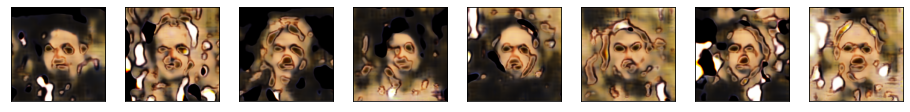

[Step 9000] D Loss: 0.1435; G Loss: 3.3790


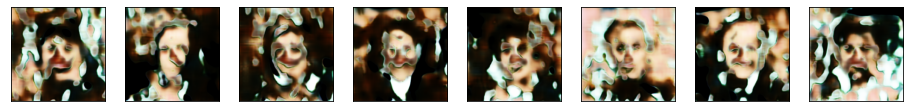

[Step 10000] D Loss: 0.0813; G Loss: 3.8396


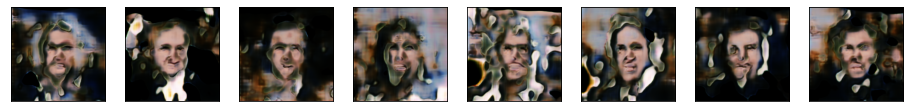

[Step 11000] D Loss: 0.2130; G Loss: 3.2878


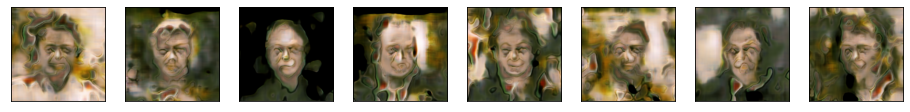

[Step 12000] D Loss: 0.0932; G Loss: 2.6720


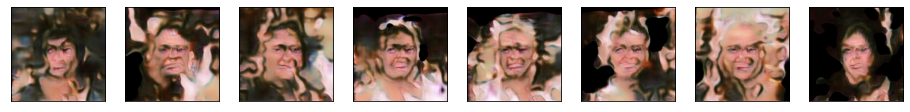

[Step 13000] D Loss: 0.1742; G Loss: 3.6934


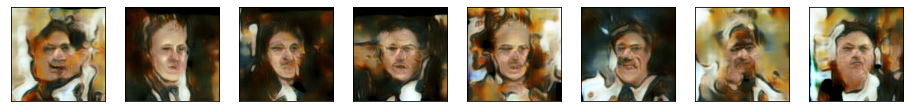

[Step 14000] D Loss: 0.3078; G Loss: 3.0972


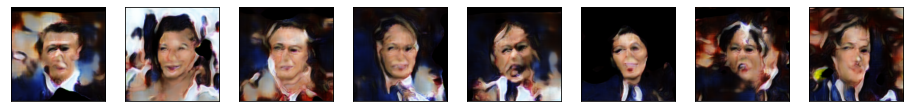

[Step 15000] D Loss: 0.3398; G Loss: 3.8348


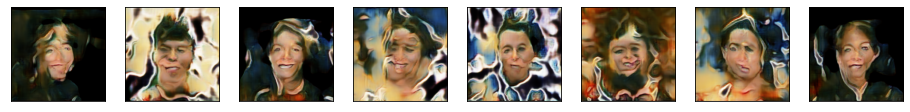

[Step 16000] D Loss: 0.2290; G Loss: 2.3648


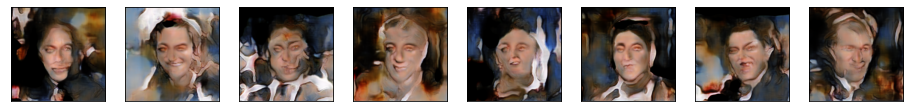

[Step 17000] D Loss: 0.1353; G Loss: 3.1539


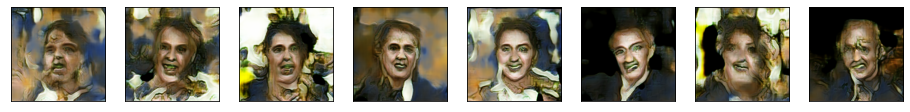

[Step 18000] D Loss: 0.2160; G Loss: 2.6357


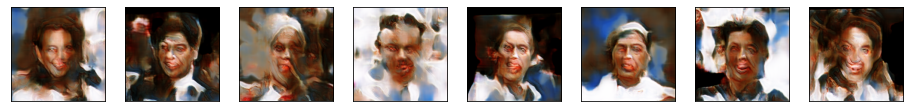

[Step 19000] D Loss: 0.2198; G Loss: 3.9848


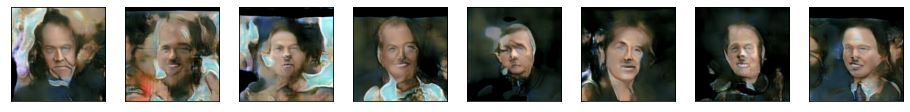

[Step 20000] D Loss: 0.1585; G Loss: 3.7387


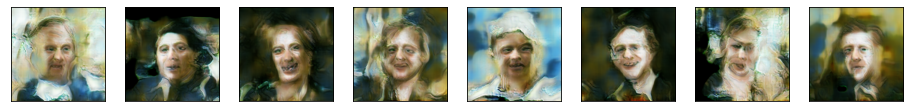

[Step 21000] D Loss: 0.4398; G Loss: 2.2597


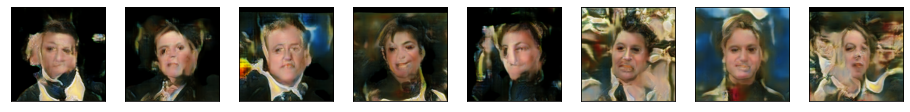

[Step 22000] D Loss: 0.1135; G Loss: 2.0477


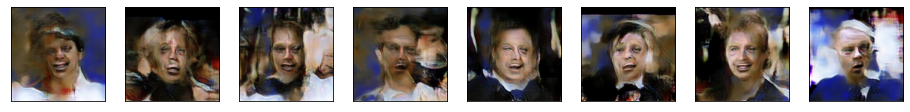

[Step 23000] D Loss: 0.2733; G Loss: 3.5245


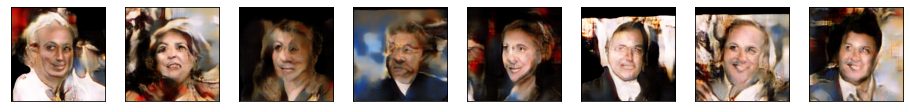

[Step 24000] D Loss: 0.1596; G Loss: 2.5987


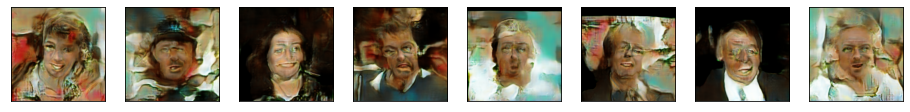

[Step 25000] D Loss: 0.2439; G Loss: 3.5046


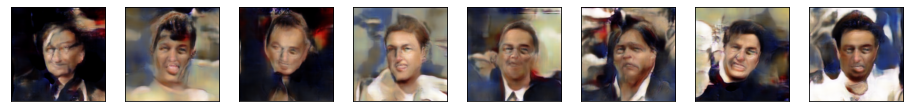

[Step 26000] D Loss: 0.1139; G Loss: 4.1255


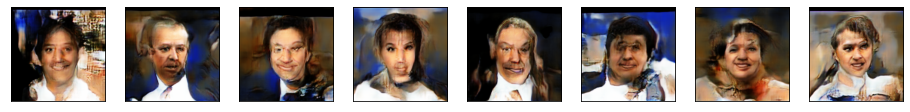

[Step 27000] D Loss: 0.3448; G Loss: 4.0565


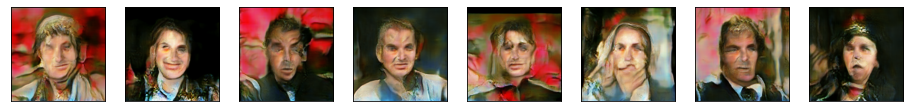

[Step 28000] D Loss: 0.1193; G Loss: 5.1321


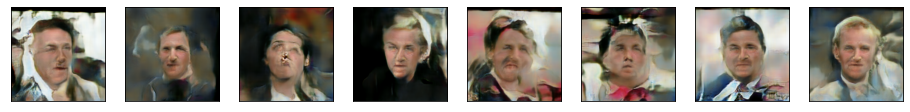

[Step 29000] D Loss: 0.1447; G Loss: 4.1037


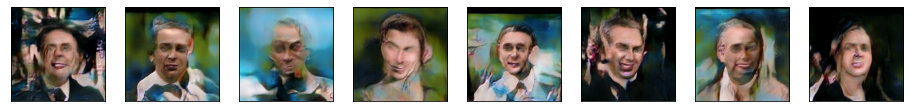

[Step 30000] D Loss: 0.1039; G Loss: 5.1354


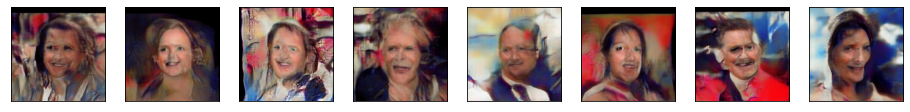

[Step 31000] D Loss: 0.0781; G Loss: 5.7783


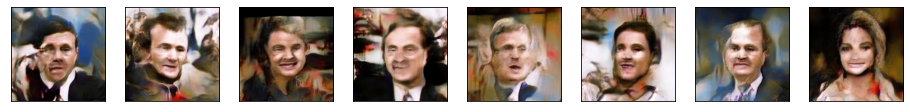

[Step 32000] D Loss: 0.0249; G Loss: 6.1645


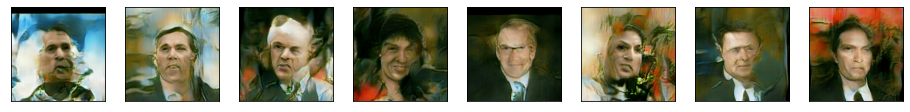

[Step 33000] D Loss: 0.7100; G Loss: 4.3211


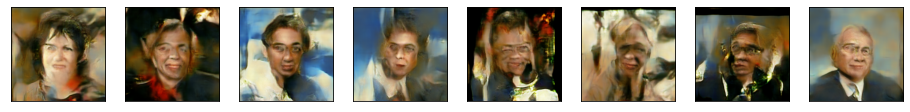

[Step 34000] D Loss: 0.2616; G Loss: 5.8911


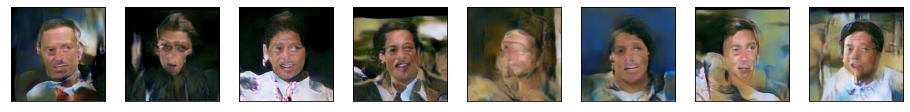

[Step 35000] D Loss: 0.1289; G Loss: 6.7062


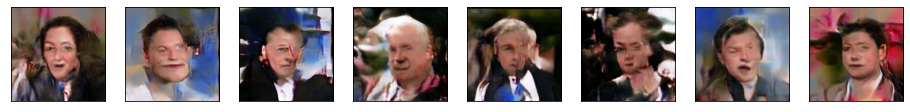

[Step 36000] D Loss: 0.0298; G Loss: 5.1800


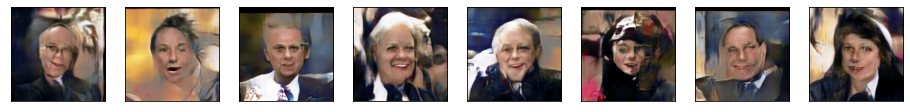

[Step 37000] D Loss: 0.2891; G Loss: 5.3195


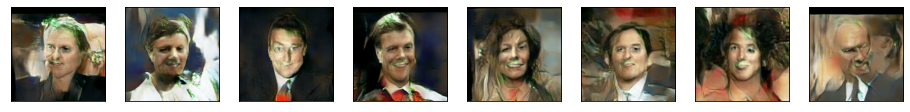

[Step 38000] D Loss: 0.0822; G Loss: 6.1177


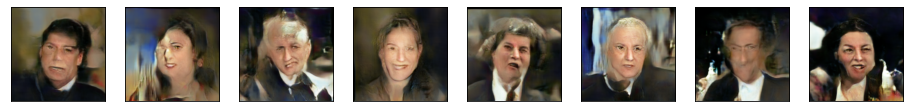

[Step 39000] D Loss: 0.0421; G Loss: 5.0262


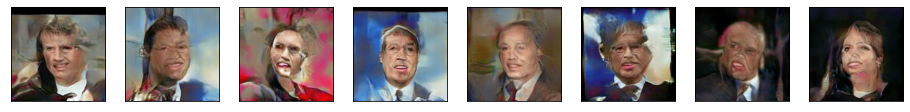

[Step 40000] D Loss: 0.1014; G Loss: 5.7428


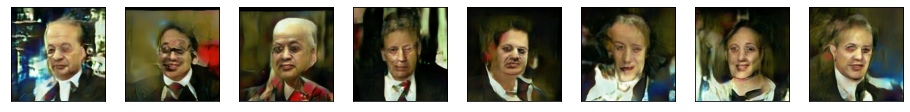

[Step 41000] D Loss: 0.0694; G Loss: 7.2004


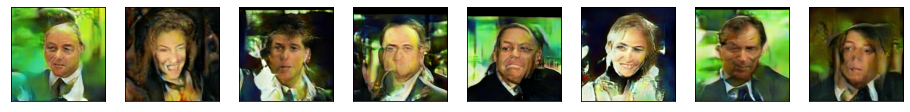

[Step 42000] D Loss: 0.3085; G Loss: 7.5249


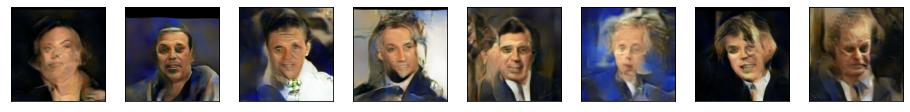

[Step 43000] D Loss: 0.0742; G Loss: 4.1314


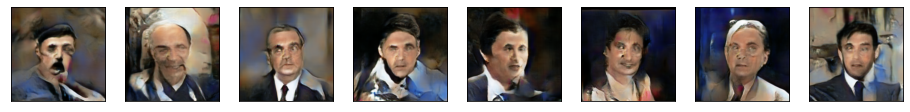

[Step 44000] D Loss: 0.0966; G Loss: 6.2859


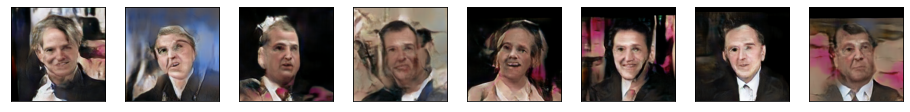

[Step 45000] D Loss: 0.0469; G Loss: 5.1329


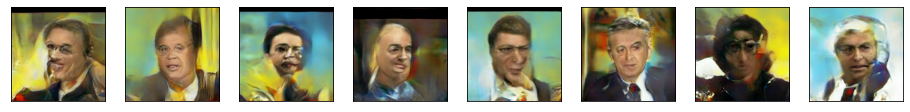

[Step 46000] D Loss: 0.0838; G Loss: 5.1472


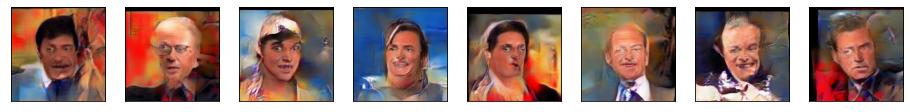

[Step 47000] D Loss: 0.1393; G Loss: 6.3631


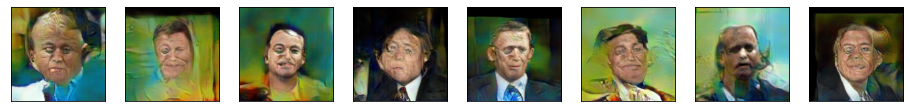

[Step 48000] D Loss: 0.1381; G Loss: 3.5678


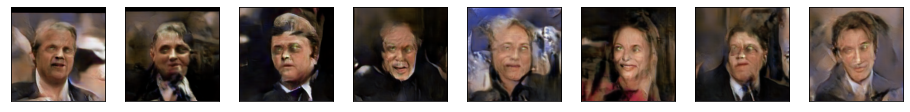

[Step 49000] D Loss: 0.0260; G Loss: 6.7931


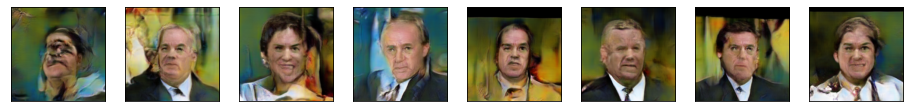

In [32]:
for step, true_images in enumerate(train_ds):
    
    # Train Discriminator
    
    noise = np.random.normal(0, 1, (HALF_BATCH_SIZE, INPUT_DIM)).astype(np.float32)
    syntetic_images = generator.predict(noise)
    x_combined = np.concatenate((
        true_images, 
        syntetic_images))
    y_combined = np.concatenate((
        np.ones((HALF_BATCH_SIZE, 1), np.float32), 
        np.zeros((HALF_BATCH_SIZE, 1), np.float32)))
    
    with tf.GradientTape() as tape:
        logits = discriminator(x_combined)
        d_loss_value = sigmoid_cross_entropy(y_combined, logits)
    grads = tape.gradient(d_loss_value, discriminator.trainable_variables)
    optimizer.apply_gradients(zip(grads, discriminator.trainable_variables))
    
    # Train Generator
    
    noise = np.random.normal(0, 1, (BATCH_SIZE, INPUT_DIM)).astype(np.float32)
    y_mislabled = np.ones((BATCH_SIZE, 1), np.float32)
    
    with tf.GradientTape() as tape:
        logits = discriminator(generator(noise, training=True))
        g_loss_value = sigmoid_cross_entropy(y_mislabled, logits)
    grads = tape.gradient(g_loss_value, generator.trainable_variables)
    optimizer.apply_gradients(zip(grads, generator.trainable_variables))
    
    # Check intermediate results
    
    if step % 1000 == 0:
        print('[Step %2d] D Loss: %.4f; G Loss: %.4f' % (
            step, d_loss_value.numpy(), g_loss_value.numpy()))
        noise = np.random.normal(0, 1, (8, INPUT_DIM)).astype(np.float32)
        syntetic_images = generator.predict(noise)
        
        fig = plt.figure(figsize=(16, 8))
        for j in range(len(syntetic_images)):
            ax = fig.add_subplot(4, 8, j+1)
            ax.imshow((syntetic_images[j]+1)/2)
            plt.xticks([]), plt.yticks([])
        plt.show()


## Тестирование свёрточного генератора

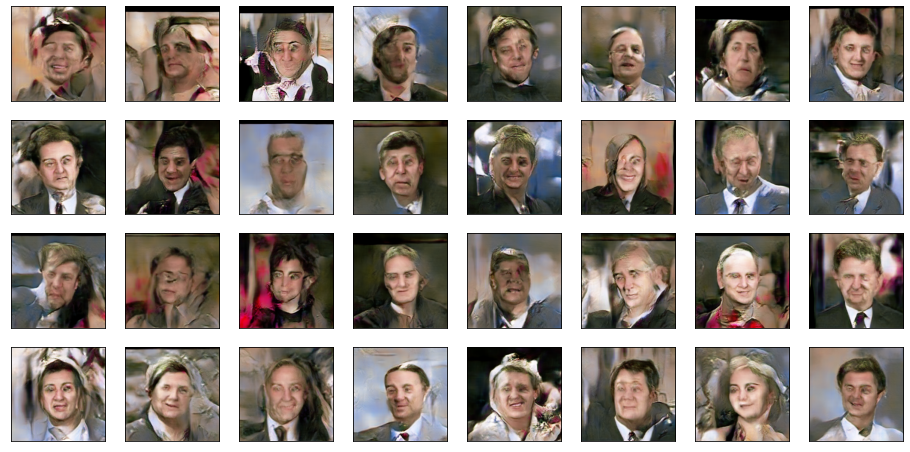

In [33]:
noise = np.random.normal(0, 1, (32, INPUT_DIM)).astype(np.float32)
syntetic_images = generator.predict(noise)

fig = plt.figure(figsize=(16, 8))
for j in range(len(syntetic_images)):
    ax = fig.add_subplot(4, 8, j+1)
    ax.imshow((syntetic_images[j]+1)/2)
    plt.xticks([]), plt.yticks([])
plt.show()

## Интерполяция в латентном пространстве

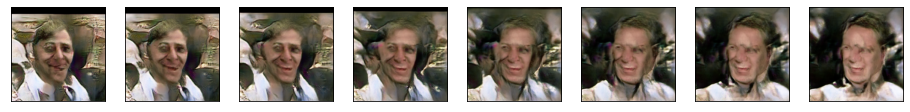

In [34]:
noise_1 = np.random.normal(0, 1, (INPUT_DIM)).astype(np.float32)
noise_2 = np.random.normal(0, 1, (INPUT_DIM)).astype(np.float32)
noise = np.linspace(noise_1, noise_2, 8)
syntetic_images = generator.predict(noise)
fig = plt.figure(figsize=(16, 8))
for j in range(len(syntetic_images)):
    ax = fig.add_subplot(4, 8, j+1)
    ax.imshow((syntetic_images[j]+1)/2)
    plt.xticks([]), plt.yticks([])
plt.show()